In [1]:
sources_trips = [
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2009-json_corrigido.json',
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2010-json_corrigido.json',
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2011-json_corrigido.json',
                  'https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2012-json_corrigido.json'
                ]
vendor_dimension = 'https://s3.amazonaws.com/data-sprints-eng-test/data-vendor_lookup-csv.csv'
payment_lookup = 'https://s3.amazonaws.com/data-sprints-eng-test/data-payment_lookup-csv.csv'

In [2]:
# Importando o pandas e o sqlalchemy para conseguir conectar ao banco
# matplotlib e seaborn para visualização
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlalchemy
import re

In [3]:
plt.rcParams.update(plt.rcParamsDefault)
%matplotlib inline
plt.rcParams['figure.figsize']=(18,9)
plt.rc('axes', titlesize=36)
sns.set_style("white")

In [4]:
def create_and_append_dataframe_from_json_file(source_filepath, target_dataframe):
  dataframe_source = pd.read_json(path_or_buf = source_filepath, lines = True)
  df_return = target_dataframe.copy(deep=True)
  df_return = df_return.append(dataframe_source, ignore_index=True)
  print(f"{source_filepath} appended to target_dataframe")
  return df_return

In [5]:
years_to_upload = []
dataframe_fact = pd.DataFrame()

In [6]:
for filepath in sources_trips:
  year = int(re.findall("\d{4}",filepath)[0])
  if year in years_to_upload:
    print(f"{year} already readed and dataframe was created and appended, no action to do!")
    pass
  else: 
    years_to_upload.append(year)
    dataframe_fact = create_and_append_dataframe_from_json_file(filepath, dataframe_fact)

https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2009-json_corrigido.json appended to target_dataframe
https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2010-json_corrigido.json appended to target_dataframe
https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2011-json_corrigido.json appended to target_dataframe
https://s3.amazonaws.com/data-sprints-eng-test/data-sample_data-nyctaxi-trips-2012-json_corrigido.json appended to target_dataframe


In [7]:
df_vendor_dimension = pd.read_csv(vendor_dimension)

In [8]:
df_vendor_dimension.head()

,vendor_id,name,address,city,state,zip,country,contact,current
0,CMT,"Creative Mobile Technologies, LLC",950 4th Road Suite 78,Brooklyn,NY,11210,USA,contactCMT@gmail.com,Yes
1,VTS,VeriFone Inc,26 Summit St.,Flushing,NY,11354,USA,admin@vtstaxi.com,Yes
2,DDS,"Dependable Driver Service, Inc",8554 North Homestead St.,Bronx,NY,10472,USA,9778896500,Yes
3,TS,Total Solutions Co,Five Boroughs Taxi Co.,Brooklyn,NY,11229,USA,mgmt@5btc.com,Yes
4,MT,Mega Taxi,4 East Jennings St.,Brooklyn,NY,11228,USA,contact@megataxico.com,No


In [9]:
df_payment_lookup = pd.read_csv(payment_lookup, header=1)

In [10]:
df_payment_lookup.head()

,payment_type,payment_lookup
0,Cas,Cash
1,CAS,Cash
2,Cre,Credit
3,CRE,Credit
4,No,No Charge


In [11]:
print(years_to_upload)
dataframe_fact.head()

[2009, 2010, 2011, 2012]


,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
0,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4
1,CMT,2009-01-13T07:40:07.639754+00:00,2009-01-13T07:50:36.386011+00:00,1,5.40,-73.996506,40.747784,NaN,NaN,-73.940449,40.792385,Cash,15.4,0.0,0.0,0.0,15.4
2,VTS,2009-01-06T19:30:44.142187+00:00,2009-01-06T19:43:09.908429+00:00,5,1.67,-73.951340,40.752070,NaN,NaN,-73.944535,40.768108,CASH,6.1,1.0,0.0,0.0,7.1
3,VTS,2009-09-24T08:28:09.004451+00:00,2009-09-24T08:41:56.739991+00:00,1,4.13,-74.001117,40.729128,NaN,NaN,-73.958122,40.721812,CASH,12.9,0.5,0.0,0.0,13.4
4,VTS,2009-10-29T05:50:39.214629+00:00,2009-10-29T05:57:22.880174+00:00,1,2.03,-73.976600,40.756873,NaN,NaN,-73.979757,40.776075,CASH,7.7,0.5,0.0,0.0,8.2


In [12]:
dataframe_fact.tail()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount
3999995,CMT,2012-07-02T02:16:07.72331+00:00,2012-07-02T02:24:36.05472+00:00,3,6.3,-73.947063,40.784441,NaN,NaN,-73.987610,40.738477,Cash,19.4,0.0,0.0,0.0,19.4
3999996,CMT,2012-04-11T16:24:49.255035+00:00,2012-04-11T16:30:46.179091+00:00,1,1.8,0.000000,0.000000,NaN,NaN,0.000000,0.000000,Cash,7.4,0.0,0.0,0.0,7.4
3999997,CMT,2012-09-15T15:00:58.80813+00:00,2012-09-15T15:08:10.313917+00:00,4,2.9,-74.006156,40.743763,NaN,NaN,-73.974005,40.764069,Cash,10.6,0.0,0.0,0.0,10.6
3999998,CMT,2012-06-25T09:17:36.81712+00:00,2012-06-25T09:31:07.322351+00:00,2,1.7,-73.979615,40.783816,NaN,NaN,-73.988470,40.764176,Credit,7.4,0.0,2.0,0.0,9.4
3999999,CMT,2012-08-24T07:25:13.503063+00:00,2012-08-24T07:38:33.870016+00:00,1,2.0,-73.988829,40.731162,NaN,NaN,-74.009790,40.710155,Cash,7.8,0.0,0.0,0.0,7.8


In [13]:
dataframe_fact.shape

(4000000, 17)

In [14]:
# instanciar banco de dados / Criar conexão banco de dados / Subir dataframes nas tabelas OOOOU Meter um AWS Glue malucão?

In [15]:
years_to_upload.sort()
print(years_to_upload)

[2009, 2010, 2011, 2012]


In [16]:
def create_date_table(start=f'{years_to_upload[0]}-01-01', end=f'{years_to_upload[-1]}-12-31'):
    df = pd.DataFrame({"date": pd.date_range(start, end)})
    df["week_day"] = df.date.dt.day_name()
    df["day"] = df.date.dt.day
    df["month"] = df.date.dt.month
    df["week"] = df.date.dt.isocalendar().week
    df["quarter"] = df.date.dt.quarter
    df["year"] = df.date.dt.year
    df.insert(0, 'date_id', (df.year.astype(str) + df.month.astype(str).str.zfill(2) + df.day.astype(str).str.zfill(2)).astype(int))
    return df

df_datetime_dimension = create_date_table()

In [17]:
df_datetime_dimension['date'] = pd.to_datetime(df_datetime_dimension['date'],infer_datetime_format=True).dt.date
df_datetime_dimension.head()

,date_id,date,week_day,day,month,week,quarter,year
0,20090101,2009-01-01,Thursday,1,1,1,1,2009
1,20090102,2009-01-02,Friday,2,1,1,1,2009
2,20090103,2009-01-03,Saturday,3,1,1,1,2009
3,20090104,2009-01-04,Sunday,4,1,1,1,2009
4,20090105,2009-01-05,Monday,5,1,2,1,2009


In [18]:
dataframe_fact['date'] = pd.to_datetime(dataframe_fact['pickup_datetime'],infer_datetime_format=True).dt.date
dataframe_fact.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date
0,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21
1,CMT,2009-01-13T07:40:07.639754+00:00,2009-01-13T07:50:36.386011+00:00,1,5.40,-73.996506,40.747784,NaN,NaN,-73.940449,40.792385,Cash,15.4,0.0,0.0,0.0,15.4,2009-01-13
2,VTS,2009-01-06T19:30:44.142187+00:00,2009-01-06T19:43:09.908429+00:00,5,1.67,-73.951340,40.752070,NaN,NaN,-73.944535,40.768108,CASH,6.1,1.0,0.0,0.0,7.1,2009-01-06
3,VTS,2009-09-24T08:28:09.004451+00:00,2009-09-24T08:41:56.739991+00:00,1,4.13,-74.001117,40.729128,NaN,NaN,-73.958122,40.721812,CASH,12.9,0.5,0.0,0.0,13.4,2009-09-24
4,VTS,2009-10-29T05:50:39.214629+00:00,2009-10-29T05:57:22.880174+00:00,1,2.03,-73.976600,40.756873,NaN,NaN,-73.979757,40.776075,CASH,7.7,0.5,0.0,0.0,8.2,2009-10-29


In [19]:
full_dataframe = pd.merge(dataframe_fact, df_datetime_dimension, on='date', how='inner')

In [20]:
full_dataframe['pickup'] = pd.to_datetime(full_dataframe['pickup_datetime'])
full_dataframe = full_dataframe.set_index(['pickup'])
full_dataframe.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year
pickup,,,,,,,,,,,,,,,,,,,,,,,,,
2009-04-21 18:51:11.767205+00:00,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 13:03:54.702194+00:00,VTS,2009-04-21T13:03:54.702194+00:00,2009-04-21T13:11:43.556342+00:00,1,0.73,-73.990523,40.756800,NaN,NaN,-73.982793,40.762035,CASH,4.5,0.0,0.0,0.0,4.5,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 22:42:07.249485+00:00,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.965126,40.766603,NaN,NaN,-73.981386,40.777663,Cash,7.1,0.0,0.0,0.0,7.1,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 12:39:30.747149+00:00,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-73.999427,40.726514,NaN,NaN,-73.968355,40.761534,Cash,10.9,0.0,0.0,0.0,10.9,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 16:09:14.427034+00:00,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.962174,40.779274,NaN,NaN,-73.982501,40.756978,Cash,9.3,0.0,0.0,0.0,9.3,2009-04-21,20090421,Tuesday,21,4,17,2,2009


In [21]:
full_dataframe.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year
pickup,,,,,,,,,,,,,,,,,,,,,,,,,
2009-04-21 18:51:11.767205+00:00,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 13:03:54.702194+00:00,VTS,2009-04-21T13:03:54.702194+00:00,2009-04-21T13:11:43.556342+00:00,1,0.73,-73.990523,40.756800,NaN,NaN,-73.982793,40.762035,CASH,4.5,0.0,0.0,0.0,4.5,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 22:42:07.249485+00:00,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.965126,40.766603,NaN,NaN,-73.981386,40.777663,Cash,7.1,0.0,0.0,0.0,7.1,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 12:39:30.747149+00:00,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-73.999427,40.726514,NaN,NaN,-73.968355,40.761534,Cash,10.9,0.0,0.0,0.0,10.9,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 16:09:14.427034+00:00,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.962174,40.779274,NaN,NaN,-73.982501,40.756978,Cash,9.3,0.0,0.0,0.0,9.3,2009-04-21,20090421,Tuesday,21,4,17,2,2009


In [22]:
full_dataframe.dtypes

vendor_id              object
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
trip_distance         float64
pickup_longitude      float64
pickup_latitude       float64
rate_code             float64
store_and_fwd_flag    float64
dropoff_longitude     float64
dropoff_latitude      float64
payment_type           object
fare_amount           float64
surcharge             float64
tip_amount            float64
tolls_amount          float64
total_amount          float64
date                   object
date_id                 int64
week_day               object
day                     int64
month                   int64
week                   UInt32
quarter                 int64
year                    int64
dtype: object

In [23]:
full_dataframe.loc['2009':'2010']

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year
pickup,,,,,,,,,,,,,,,,,,,,,,,,,
2009-04-21 18:51:11.767205+00:00,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.004114,40.742950,NaN,NaN,-73.994712,40.747950,Cash,5.4,0.0,0.0,0.0,5.4,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 13:03:54.702194+00:00,VTS,2009-04-21T13:03:54.702194+00:00,2009-04-21T13:11:43.556342+00:00,1,0.73,-73.990523,40.756800,NaN,NaN,-73.982793,40.762035,CASH,4.5,0.0,0.0,0.0,4.5,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 22:42:07.249485+00:00,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.965126,40.766603,NaN,NaN,-73.981386,40.777663,Cash,7.1,0.0,0.0,0.0,7.1,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 12:39:30.747149+00:00,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-73.999427,40.726514,NaN,NaN,-73.968355,40.761534,Cash,10.9,0.0,0.0,0.0,10.9,2009-04-21,20090421,Tuesday,21,4,17,2,2009
2009-04-21 16:09:14.427034+00:00,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.962174,40.779274,NaN,NaN,-73.982501,40.756978,Cash,9.3,0.0,0.0,0.0,9.3,2009-04-21,20090421,Tuesday,21,4,17,2,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010-09-01 09:18:50.048910+00:00,VTS,2010-09-01T09:18:50.04891+00:00,2010-09-01T09:22:03.054964+00:00,2,0.94,-73.991617,40.750108,NaN,NaN,-73.978955,40.751582,CASH,6.1,0.5,0.0,0.0,6.6,2010-09-01,20100901,Wednesday,1,9,35,3,2010
2010-09-01 04:33:00.757982+00:00,VTS,2010-09-01T04:33:00.757982+00:00,2010-09-01T04:39:31.910811+00:00,1,1.25,-73.990532,40.755968,NaN,NaN,-73.974072,40.756695,Credit,6.5,0.0,1.0,0.0,7.5,2010-09-01,20100901,Wednesday,1,9,35,3,2010
2010-09-01 17:59:19.921521+00:00,CMT,2010-09-01T17:59:19.921521+00:00,2010-09-01T18:08:04.061601+00:00,2,2.70,-73.991515,40.731691,NaN,NaN,-73.994647,40.760841,Cash,10.5,0.0,0.0,0.0,10.5,2010-09-01,20100901,Wednesday,1,9,35,3,2010


In [24]:
df_payment_lookup.dtypes

payment_type      object
payment_lookup    object
dtype: object

In [25]:
# 1. Qual a distância média percorrida por viagens com no máximo 2 passageiros?
media = full_dataframe[full_dataframe['passenger_count'] <= 2]['trip_distance'].mean()
print(round(media,2))

2.66


In [26]:
# 2. Quais os 3 maiores vendors em quantidade total de dinheiro arrecadado;
maiores_vendors = full_dataframe.groupby(['vendor_id'])['total_amount'].agg('sum').sort_values(ascending=False)
pd.options.display.float_format = '{:.2f}'.format
maiores_vendors.reset_index()[:3]

,vendor_id,total_amount
0,CMT,19549084.28
1,VTS,19043434.00
2,DDS,2714901.72


In [27]:
full_dataframe_payment = pd.merge(full_dataframe, df_payment_lookup, on='payment_type', how='inner')
full_dataframe_payment.head()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup
0,CMT,2009-04-21T18:51:11.767205+00:00,2009-04-21T18:57:09.433767+00:00,2,0.80,-74.00,40.74,nan,nan,-73.99,40.75,Cash,5.40,0.00,0.00,0.00,5.40,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
1,CMT,2009-04-21T22:42:07.249485+00:00,2009-04-21T22:49:06.879952+00:00,2,1.40,-73.97,40.77,nan,nan,-73.98,40.78,Cash,7.10,0.00,0.00,0.00,7.10,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
2,CMT,2009-04-21T12:39:30.747149+00:00,2009-04-21T12:47:11.330268+00:00,1,3.40,-74.00,40.73,nan,nan,-73.97,40.76,Cash,10.90,0.00,0.00,0.00,10.90,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
3,CMT,2009-04-21T16:09:14.427034+00:00,2009-04-21T16:15:29.611933+00:00,1,2.10,-73.96,40.78,nan,nan,-73.98,40.76,Cash,9.30,0.00,0.00,0.00,9.30,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash
4,CMT,2009-04-21T14:22:45.813124+00:00,2009-04-21T14:33:51.395183+00:00,4,0.70,-73.98,40.77,nan,nan,-73.99,40.76,Cash,4.90,0.00,0.00,0.00,4.90,2009-04-21,20090421,Tuesday,21,4,17,2,2009,Cash


In [28]:
# 3. Faça um histograma da distribuição mensal, nos 4 anos, de corridas pagas em dinheiro;
corridas_dinheiro = full_dataframe_payment[full_dataframe_payment['payment_lookup'] == 'Cash']
corridas_dinheiro.reset_index()
corridas_dinheiro.shape

(3242852, 26)

In [29]:
# corridas_dinheiro.sort_values(by=['year','month'], inplace=True)

In [30]:
# corridas_dinheiro.groupby([corridas_dinheiro["year"], corridas_dinheiro["month"]])['total_amount'].count().plot(kind="bar")
corridas_dinheiro_hist = corridas_dinheiro.groupby(['year', 'month'])['payment_type'].agg('count').reset_index()

In [31]:
corridas_dinheiro_hist

,year,month,payment_type
0,2009,1,66824
1,2009,2,66680
2,2009,3,73948
3,2009,4,71142
4,2009,5,74151
5,2009,6,71342
6,2009,7,74076
7,2009,8,74021
8,2009,9,71511
9,2009,10,74011


In [32]:
corridas_dinheiro_hist['year_month'] = corridas_dinheiro_hist['year'].astype(str) + '-' + corridas_dinheiro_hist['month'].astype(str)

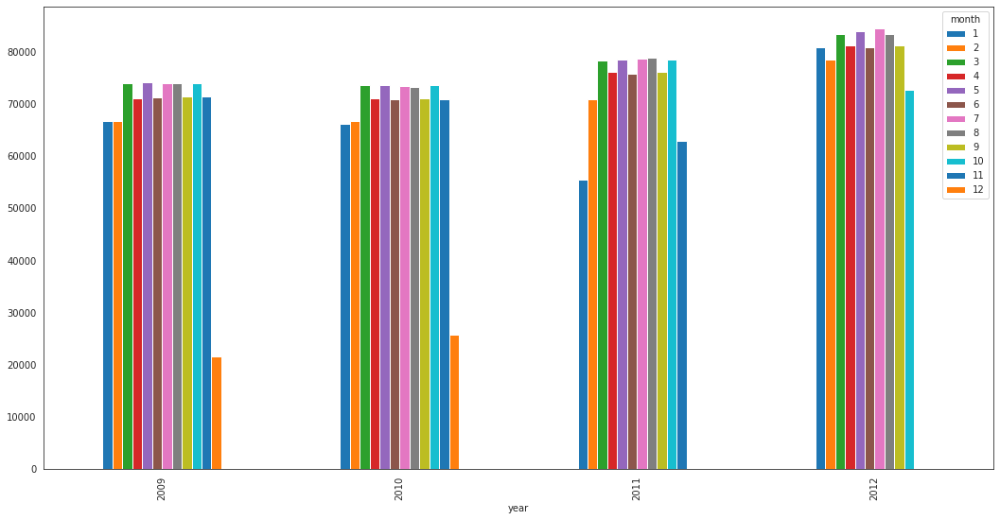

In [33]:
corridas_dinheiro_hist.pivot('year','month','payment_type').plot.bar()

In [34]:
full_dataframe_payment.dtypes

vendor_id              object
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
trip_distance         float64
pickup_longitude      float64
pickup_latitude       float64
rate_code             float64
store_and_fwd_flag    float64
dropoff_longitude     float64
dropoff_latitude      float64
payment_type           object
fare_amount           float64
surcharge             float64
tip_amount            float64
tolls_amount          float64
total_amount          float64
date                   object
date_id                 int64
week_day               object
day                     int64
month                   int64
week                   UInt32
quarter                 int64
year                    int64
payment_lookup         object
dtype: object

In [35]:
# 4. Faça um gráfico de série temporal contando a quantidade de gorjetas de cada dia, nos últimos 3 meses de 2012.
full_dataframe_payment['pickup_datetime'] = pd.to_datetime(full_dataframe_payment['pickup_datetime'])

In [36]:
mask = (full_dataframe_payment['pickup_datetime'] > '2012-10-01') & (full_dataframe_payment['pickup_datetime'] <= '2012-12-31')
gorjetas_3m_2012 = full_dataframe_payment.loc[mask]

In [37]:
gorjetas_3m_2012.tail(10)

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup
3999887,CMT,2012-10-07 20:41:42.750510+00:00,2012-10-07T20:53:54.379067+00:00,1,0.00,0.00,0.00,nan,nan,0.00,0.00,Dispute,3.00,0.00,0.00,0.00,3.00,2012-10-07,20121007,Sunday,7,10,40,4,2012,Dispute
3999888,CMT,2012-10-07 22:51:02.285972+00:00,2012-10-07T23:00:34.894164+00:00,2,16.90,-73.97,40.75,nan,nan,-73.78,40.64,Dispute,45.00,0.00,0.00,0.00,45.00,2012-10-07,20121007,Sunday,7,10,40,4,2012,Dispute
3999896,CMT,2012-10-10 16:07:09.617411+00:00,2012-10-10T16:18:10.151476+00:00,1,2.80,-73.96,40.77,nan,nan,-73.94,40.75,Dispute,9.40,0.00,0.00,0.00,9.40,2012-10-10,20121010,Wednesday,10,10,41,4,2012,Dispute
3999904,CMT,2012-10-08 16:34:30.871675+00:00,2012-10-08T16:40:52.032854+00:00,1,0.00,-73.78,40.64,nan,nan,-73.78,40.64,Dispute,2.50,0.00,0.00,0.00,2.50,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999905,CMT,2012-10-08 06:13:41.852231+00:00,2012-10-08T06:23:33.40704+00:00,1,4.50,-74.00,40.76,nan,nan,-73.94,40.79,Dispute,12.50,0.00,0.00,0.00,12.50,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999906,CMT,2012-10-08 10:06:36.127671+00:00,2012-10-08T10:15:54.00597+00:00,1,0.00,-73.98,40.73,nan,nan,-73.98,40.73,Dispute,3.00,0.00,0.00,0.00,3.00,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999946,CMT,2012-10-25 18:45:26.410800+00:00,2012-10-25T18:55:49.283931+00:00,1,1.50,-73.99,40.73,nan,nan,-73.99,40.72,Dispute,7.70,0.00,0.00,0.00,7.70,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999947,CMT,2012-10-25 16:58:53.120191+00:00,2012-10-25T17:06:18.771585+00:00,2,7.80,-73.87,40.77,nan,nan,-73.95,40.78,Dispute,18.60,0.00,0.00,0.00,18.60,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999958,CMT,2012-10-04 13:31:51.381412+00:00,2012-10-04T13:38:13.535278+00:00,1,2.80,-73.98,40.76,nan,nan,-74.00,40.73,Dispute,11.30,0.00,0.00,0.00,11.30,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute
3999959,CMT,2012-10-04 22:55:19.586688+00:00,2012-10-04T23:06:21.616467+00:00,1,4.60,-73.99,40.72,nan,nan,-73.95,40.78,Dispute,13.80,0.00,0.00,0.00,13.80,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute


In [38]:
gorjetas_time_series = gorjetas_3m_2012.groupby(gorjetas_3m_2012['pickup_datetime'].dt.date)['pickup_datetime'].agg('count')
gorjetas_time_series

pickup_datetime
2012-10-01    3273
2012-10-02    3324
2012-10-03    3387
2012-10-04    3367
2012-10-05    3312
2012-10-06    3289
2012-10-07    3286
2012-10-08    3220
2012-10-09    3360
2012-10-10    3403
2012-10-11    3237
2012-10-12    3330
2012-10-13    3365
2012-10-14    3261
2012-10-15    3467
2012-10-16    3259
2012-10-17    3381
2012-10-18    3322
2012-10-19    3340
2012-10-20    3301
2012-10-21    3283
2012-10-22    3296
2012-10-23    3372
2012-10-24    3401
2012-10-25    3245
2012-10-26    3371
2012-10-27    3297
Name: pickup_datetime, dtype: int64

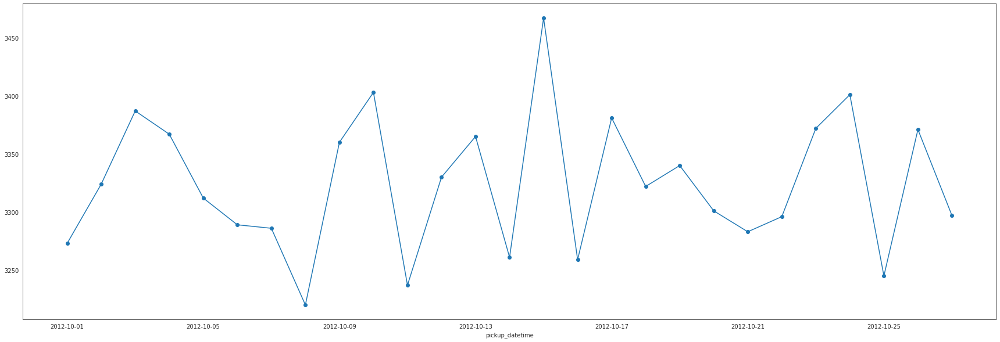

In [39]:
# fig, axs = plt.subplots(figsize=(12, 4))
gorjetas_time_series.plot(style="-o", figsize=(30, 10))

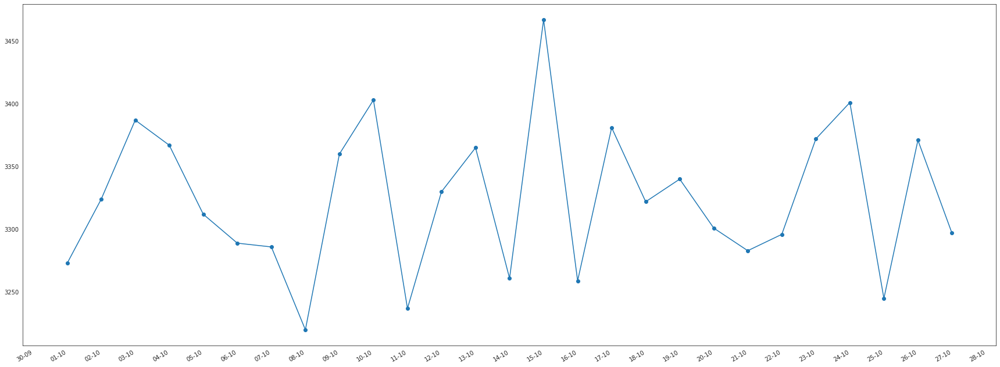

In [40]:
import matplotlib.dates as mdates
# Plot
plt.figure(figsize=(30,12))
plt.plot(gorjetas_time_series, marker='o', linestyle='-')
ax = plt.gca()
ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%m'))
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gcf().autofmt_xdate()
plt.show()

In [41]:
# Últimos dados são de outubro/2012
full_dataframe_sorted = full_dataframe_payment.sort_values(by=['year','month'])
full_dataframe_sorted.tail()

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup
3999906,CMT,2012-10-08 10:06:36.127671+00:00,2012-10-08T10:15:54.00597+00:00,1,0.00,-73.98,40.73,nan,nan,-73.98,40.73,Dispute,3.00,0.00,0.00,0.00,3.00,2012-10-08,20121008,Monday,8,10,41,4,2012,Dispute
3999946,CMT,2012-10-25 18:45:26.410800+00:00,2012-10-25T18:55:49.283931+00:00,1,1.50,-73.99,40.73,nan,nan,-73.99,40.72,Dispute,7.70,0.00,0.00,0.00,7.70,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999947,CMT,2012-10-25 16:58:53.120191+00:00,2012-10-25T17:06:18.771585+00:00,2,7.80,-73.87,40.77,nan,nan,-73.95,40.78,Dispute,18.60,0.00,0.00,0.00,18.60,2012-10-25,20121025,Thursday,25,10,43,4,2012,Dispute
3999958,CMT,2012-10-04 13:31:51.381412+00:00,2012-10-04T13:38:13.535278+00:00,1,2.80,-73.98,40.76,nan,nan,-74.00,40.73,Dispute,11.30,0.00,0.00,0.00,11.30,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute
3999959,CMT,2012-10-04 22:55:19.586688+00:00,2012-10-04T23:06:21.616467+00:00,1,4.60,-73.99,40.72,nan,nan,-73.95,40.78,Dispute,13.80,0.00,0.00,0.00,13.80,2012-10-04,20121004,Thursday,4,10,40,4,2012,Dispute


In [42]:
# Qual o tempo médio das corridas nos dias de sábado e domingo;
weekend_data = full_dataframe_payment[full_dataframe_payment['week_day'].isin(['Saturday', 'Sunday'])]
weekend_data.shape

(1132674, 26)

In [43]:
weekend_data.dtypes

vendor_id                          object
pickup_datetime       datetime64[ns, UTC]
dropoff_datetime                   object
passenger_count                     int64
trip_distance                     float64
pickup_longitude                  float64
pickup_latitude                   float64
rate_code                         float64
store_and_fwd_flag                float64
dropoff_longitude                 float64
dropoff_latitude                  float64
payment_type                       object
fare_amount                       float64
surcharge                         float64
tip_amount                        float64
tolls_amount                      float64
total_amount                      float64
date                               object
date_id                             int64
week_day                           object
day                                 int64
month                               int64
week                               UInt32
quarter                           

In [44]:
weekend_data['dropoff_datetime'] = pd.to_datetime(weekend_data['dropoff_datetime'])
#weekend_data['time_delta'] = pd.Timedelta(weekend_data['dropoff_datetime'] - weekend_data['pickup_datetime']).seconds / 60.0
weekend_data['total_minutes'] = (weekend_data['dropoff_datetime'] - weekend_data['pickup_datetime']) / pd.Timedelta(minutes=1)
weekend_data.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,surcharge,tip_amount,tolls_amount,total_amount,date,date_id,week_day,day,month,week,quarter,year,payment_lookup,total_minutes
10510,CMT,2009-06-27 23:54:48.442647+00:00,2009-06-28 00:01:16.068097+00:00,1,0.50,-73.98,40.74,nan,nan,-73.98,40.74,Cash,4.30,0.00,0.00,0.00,4.30,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,6.46
10511,CMT,2009-06-27 15:43:58.925457+00:00,2009-06-27 15:49:43.628136+00:00,2,3.30,-74.01,40.71,nan,nan,-73.99,40.75,Cash,12.30,0.00,0.00,0.00,12.30,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,5.75
10512,CMT,2009-06-27 21:40:34.131879+00:00,2009-06-27 21:47:35.506339+00:00,1,2.20,-73.99,40.75,nan,nan,-73.96,40.76,Cash,8.90,0.00,0.00,0.00,8.90,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,7.02
10513,CMT,2009-06-27 16:48:25.876118+00:00,2009-06-27 16:58:43.979777+00:00,1,1.20,-73.98,40.76,nan,nan,-73.98,40.75,Cash,5.70,0.00,0.00,0.00,5.70,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,10.30
10514,CMT,2009-06-27 13:16:20.725265+00:00,2009-06-27 13:27:29.717781+00:00,1,1.80,-73.95,40.79,nan,nan,-73.97,40.79,Cash,7.30,0.00,0.00,0.00,7.30,2009-06-27,20090627,Saturday,27,6,26,2,2009,Cash,11.15


In [45]:
media_corridas_weekend = weekend_data['total_minutes'].mean()
print(f'O tempo médio das corridas nos finais de semanas foi de {round(media_corridas_weekend,2)} minutos.')

O tempo médio das corridas nos finais de semanas foi de 8.75 minutos.


In [46]:
# Fazer uma visualização em mapa com latitude e longitude de pickups and dropoffs no ano de 2010;
corridas_2010 = full_dataframe.loc['2010']
corridas_2010.shape

(1000000, 25)

In [51]:
!pip install geopandas
import pandas as pd
from shapely.geometry import Point
import geopandas as gpd
from geopandas import GeoDataFrame

     |████████████████████████████████| 1.0 MB 5.5 MB/s 
     |████████████████████████████████| 15.4 MB 598 kB/s 
     |████████████████████████████████| 6.3 MB 35.7 MB/s 


In [54]:
corridas_2010.dtypes

vendor_id              object
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
trip_distance         float64
pickup_longitude      float64
pickup_latitude       float64
rate_code             float64
store_and_fwd_flag    float64
dropoff_longitude     float64
dropoff_latitude      float64
payment_type           object
fare_amount           float64
surcharge             float64
tip_amount            float64
tolls_amount          float64
total_amount          float64
date                   object
date_id                 int64
week_day               object
day                     int64
month                   int64
week                   UInt32
quarter                 int64
year                    int64
dtype: object

In [89]:
import folium
map_1 = folium.Map(location=[40.767937,-73.982155 ],tiles='OpenStreetMap', zoom_start=12)
for each in corridas_2010[:10000].iterrows():
    folium.CircleMarker([each[1]['pickup_latitude'],each[1]['pickup_longitude']],
                        radius=3,
                        color='blue',
                        popup=str(each[1]['pickup_latitude'])+','+str(each[1]['pickup_longitude']),
                        fill_color='#FD8A6C'
                        ).add_to(map_1)
map_1